In [324]:
# Import necessary libraries
import pandas as pd
import folium
import matplotlib.pyplot as plt
import seaborn as sns
from geopy.distance import geodesic
from scipy.spatial import ConvexHull
import branca.colormap as cm
from folium.plugins import MarkerCluster
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import DBSCAN

In [326]:
# Load the data
df = pd.read_excel('TOGO_LOCATION DETAILS_19-08-2023.xlsx', sheet_name='Sheet1')
df[['Latitude', 'Longitude']] = df['Coordinates'].str.split(',', expand=True).astype(float)

In [328]:
# Run DBSCAN clustering
coordinates = df[['Latitude', 'Longitude']].to_numpy()
db = DBSCAN(eps=0.01, min_samples=5).fit(coordinates)
df['Cluster'] = db.labels_

In [330]:
df.head()

,Sl.no,Vehicle Number,Country,Latt/lang,Coordinates,Latitude,Longitude,Cluster
0,1,DR4565,TOGO,"(6.150916,1.166555)","6.150916,1.166555",6.150916,1.166555,0
1,2,DR1718,TOGO,"(6.163551,1.156542)","6.163551,1.156542",6.163551,1.156542,0
2,3,DO7016,TOGO,"(6.163138,1.15666)","6.163138,1.15666",6.163138,1.156660,0
3,4,DR5419,TOGO,"(6.155077,1.159183)","6.155077,1.159183",6.155077,1.159183,0
4,5,DO6972,TOGO,"(6.154688,1.161805)","6.154688,1.161805",6.154688,1.161805,0


In [332]:
# Summarize clusters
cluster_summary = df.groupby('Cluster').agg(
    num_points=('Vehicle Number', 'count'),
    avg_latitude=('Latitude', 'mean'),
    avg_longitude=('Longitude', 'mean')
).reset_index()

In [334]:
cluster_summary = cluster_summary.sort_values(by='num_points', ascending=False)
cluster_summary.head()

,Cluster,num_points,avg_latitude,avg_longitude
1,0,2742,6.200340,1.204060
5,4,451,6.306743,1.215707
0,-1,370,6.640913,1.285391
6,5,161,6.258901,1.278531
19,18,146,6.417738,1.203619


### Too many points in the cluster, lets' change the DBScan parameters. 

In [337]:
db = DBSCAN(eps=0.004, min_samples=7).fit(df[['Latitude', 'Longitude']])

df['Cluster'] = db.labels_
# Summarize clusters
cluster_summary = df.groupby('Cluster').agg(
    num_points=('Vehicle Number', 'count'),
    avg_latitude=('Latitude', 'mean'),
    avg_longitude=('Longitude', 'mean')
).reset_index()
cluster_summary = cluster_summary.sort_values(by='num_points', ascending=False)
cluster_summary.head()

,Cluster,num_points,avg_latitude,avg_longitude
0,-1,1601,6.412149,1.242925
3,2,617,6.220092,1.178441
8,7,303,6.297246,1.213077
10,9,192,6.183301,1.195095
9,8,150,6.156933,1.211930


In [339]:
# Filter out clusters with less than 20 bikes
filtered_clusters = cluster_summary[cluster_summary['num_points'] >= 20]

In [341]:
# Function to calculate the standard deviation of distances from the cluster center
def calculate_stdev_distance(cluster_data, center_lat, center_lon):
    distances = cluster_data.apply(
        lambda row: geodesic((row['Latitude'], row['Longitude']), (center_lat, center_lon)).kilometers,
        axis=1
    )
    return distances.std()

# Add the standard deviation of distances to the cluster summary
filtered_clusters['stdev_distance'] = filtered_clusters.apply(
    lambda row: calculate_stdev_distance(
        df[df['Cluster'] == row['Cluster']],
        row['avg_latitude'],
        row['avg_longitude']
    ),
    axis=1
)

/var/folders/n1/77vyb2194ps0phyzg6jlbrm80000gp/T/ipykernel_87308/1434309460.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [342]:
# Visualize clusters on a map
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=8)

# Define a color map for population density
colormap = cm.LinearColormap(
    colors=['green', 'yellow', 'red'],
    vmin=filtered_clusters['num_points'].min(),
    vmax=filtered_clusters['num_points'].max(),
    caption='Number of Bikes'
)

In [345]:
import pandas as pd
import folium
from folium.plugins import HeatMap
from IPython.display import display, IFrame

# Load the data
df = pd.read_excel('TOGO_LOCATION DETAILS_19-08-2023.xlsx', sheet_name='Sheet1')
df[['Latitude', 'Longitude']] = df['Coordinates'].str.split(',', expand=True).astype(float)

# Initialize the map centered around the average location
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)

# Prepare data for the heatmap
heat_data = df[['Latitude', 'Longitude']].values.tolist()

# Add a heatmap layer to the map
HeatMap(heat_data, radius=15).add_to(m)

# Save the map to an HTML file and display it
m.save('togo_heatmap.html')
display(IFrame('togo_heatmap.html', width=800, height=600))


   Sl.no Vehicle Number Country            Latt/lang        Coordinates  \
0      1         DR4565    TOGO  (6.150916,1.166555)  6.150916,1.166555   
1      2         DR1718    TOGO  (6.163551,1.156542)  6.163551,1.156542   
2      3         DO7016    TOGO   (6.163138,1.15666)   6.163138,1.15666   
3      4         DR5419    TOGO  (6.155077,1.159183)  6.155077,1.159183   
4      5         DO6972    TOGO  (6.154688,1.161805)  6.154688,1.161805   

   Latitude  Longitude  Population_Density  
0  6.150916   1.166555                 193  
1  6.163551   1.156542                 193  
2  6.163138   1.156660                 193  
3  6.155077   1.159183                 193  
4  6.154688   1.161805                 193  


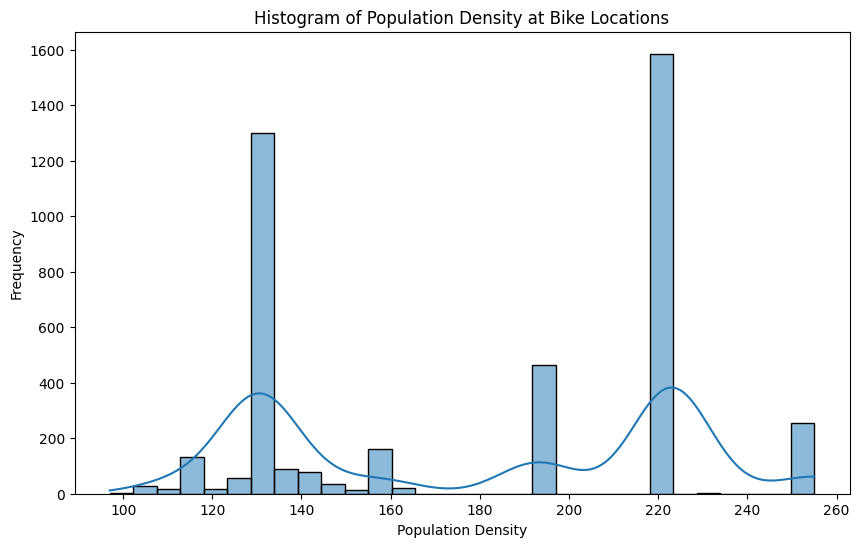

In [347]:
import pandas as pd
import rasterio
from rasterio.plot import show
from rasterio.mask import mask
from shapely.geometry import Point, mapping
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the bike data
df = pd.read_excel('TOGO_LOCATION DETAILS_19-08-2023.xlsx', sheet_name='Sheet1')
df[['Latitude', 'Longitude']] = df['Coordinates'].str.split(',', expand=True).astype(float)

# Load the new population density raster file - https://neo.gsfc.nasa.gov/view.php?datasetId=SEDAC_POP
raster_path = 'SEDAC_POP_2000-01-01_rgb_3600x1800.TIFF'
raster = rasterio.open(raster_path)

# Function to sample population density at given coordinates
def sample_population_density(lat, lon, raster):
    point = Point(lon, lat)
    coords = [mapping(point)]
    try:
        out_image, out_transform = mask(raster, coords, crop=True)
        data = out_image[0]  # Access the first band
        if data.size > 0:
            return data[0, 0]
        else:
            return np.nan
    except ValueError:
        return np.nan

# Sample population density for each bike location
df['Population_Density'] = df.apply(
    lambda row: sample_population_density(row['Latitude'], row['Longitude'], raster),
    axis=1
)

# Display the updated DataFrame
print(df.head())

# Plot a histogram of the population density values
plt.figure(figsize=(10, 6))
sns.histplot(df['Population_Density'].dropna(), bins=30, kde=True)
plt.title('Histogram of Population Density at Bike Locations')
plt.xlabel('Population Density')
plt.ylabel('Frequency')
plt.show()

## Insights: 
Two main clusters: 
- Low population density
- High population density. 

This is a huge insight for marketing analytics. Most of our focus has been on Densely populated areas! 

# Gridded GDP analysis

In [350]:
# https://resourcewatch.org/data/explore/soc073-Gridded-GDP?section=Discover&selectedCollection=&zoom=4.240327380036761&lat=9.987912300158884&lng=1.1719412049936642&pitch=0&bearing=0&basemap=dark&labels=light&layers=%255B%257B%2522dataset%2522%253A%252275d5e90e-2baa-4664-a3fb-9e136c1c5535%2522%252C%2522opacity%2522%253A1%252C%2522layer%2522%253A%252259c4d394-f5a2-459d-a1a2-2a19e4823244%2522%257D%255D&aoi=&page=1&sort=most-viewed&sortDirection=-1

In [353]:
import pandas as pd
import xarray as xr
import numpy as np
import folium
from folium.plugins import MarkerCluster
import branca.colormap as cm

# Load the bike data
df[['Latitude', 'Longitude']] = df['Coordinates'].str.split(',', expand=True)

# Convert Latitude and Longitude to strings to handle non-numeric values
df['Latitude'] = df['Latitude'].astype(str)
df['Longitude'] = df['Longitude'].astype(str)

# Remove non-numeric values from the Latitude and Longitude columns
df = df[df['Latitude'].apply(lambda x: x.replace('.', '', 1).isdigit()) & df['Longitude'].apply(lambda x: x.replace('.', '', 1).isdigit())]

# Convert Latitude and Longitude to float
df[['Latitude', 'Longitude']] = df[['Latitude', 'Longitude']].astype(float)

# Load the GDP NetCDF file
nc_file = 'doi_10_5061_dryad_dk1j0__v20200213/GDP_PPP_30arcsec_v3.nc'
ds = xr.open_dataset(nc_file)

# Function to sample GDP at given coordinates
def sample_gdp(lat, lon, ds):
    try:
        gdp_value = ds.sel(latitude=lat, longitude=lon, method='nearest')['GDP_PPP'].values
        return gdp_value[0] if gdp_value.size > 0 else np.nan
    except Exception as e:
        print(f"Error sampling GDP data: {e}")
        return np.nan

# Sample GDP data for each bike location
df['GDP_PPP'] = df.apply(
    lambda row: sample_gdp(row['Latitude'], row['Longitude'], ds),
    axis=1
)

# Initialize a map centered around the mean location
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=7)

# Create a colormap
min_gdp = df['GDP_PPP'].min()
max_gdp = df['GDP_PPP'].max()
colormap = cm.linear.YlOrRd_09.scale(min_gdp, max_gdp)
colormap.caption = 'GDP (PPP)'

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add markers to the map with colors based on GDP values
for idx, row in df.iterrows():
    if not np.isnan(row['GDP_PPP']):
        color = colormap(row['GDP_PPP'])
    else:
        color = 'gray'
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=5,
        popup=f"Vehicle Number: {row['Vehicle Number']}<br>GDP (PPP): {row['GDP_PPP']}",
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7
    ).add_to(marker_cluster)

# Add the colormap to the map
colormap.add_to(m)

# Save the map to an HTML file and display it
m.save('Bike_Locations_with_GDP_Map.html')
m


In [354]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4263 entries, 0 to 4262
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Sl.no               4263 non-null   int64  
 1   Vehicle Number      4263 non-null   object 
 2   Country             4263 non-null   object 
 3   Latt/lang           4263 non-null   object 
 4   Coordinates         4263 non-null   object 
 5   Latitude            4263 non-null   float64
 6   Longitude           4263 non-null   float64
 7   Population_Density  4263 non-null   uint8  
 8   GDP_PPP             4007 non-null   float32
dtypes: float32(1), float64(2), int64(1), object(4), uint8(1)
memory usage: 254.1+ KB


In [355]:
import pandas as pd
import xarray as xr
import numpy as np

# Split the coordinates into latitude and longitude
df[['Latitude', 'Longitude']] = df['Coordinates'].str.split(',', expand=True)

# Identify non-numeric values in the Latitude and Longitude columns
non_numeric_coords = df[~df['Latitude'].str.replace('.', '', 1).str.isdigit() | ~df['Longitude'].str.replace('.', '', 1).str.isdigit()]
print("Non-numeric coordinates:\n", non_numeric_coords)

# Remove non-numeric values from the DataFrame
df = df[df['Latitude'].str.replace('.', '', 1).str.isdigit() & df['Longitude'].str.replace('.', '', 1).str.isdigit()]

# Convert Latitude and Longitude to float
df[['Latitude', 'Longitude']] = df[['Latitude', 'Longitude']].astype(float)


Non-numeric coordinates:
 Empty DataFrame
Columns: [Sl.no, Vehicle Number, Country, Latt/lang, Coordinates, Latitude, Longitude, Population_Density, GDP_PPP]
Index: []


In [356]:
df.head()

,Sl.no,Vehicle Number,Country,Latt/lang,Coordinates,Latitude,Longitude,Population_Density,GDP_PPP
0,1,DR4565,TOGO,"(6.150916,1.166555)","6.150916,1.166555",6.150916,1.166555,193,1.327984e+06
1,2,DR1718,TOGO,"(6.163551,1.156542)","6.163551,1.156542",6.163551,1.156542,193,5.128403e+05
2,3,DO7016,TOGO,"(6.163138,1.15666)","6.163138,1.15666",6.163138,1.156660,193,5.128403e+05
3,4,DR5419,TOGO,"(6.155077,1.159183)","6.155077,1.159183",6.155077,1.159183,193,1.327984e+06
4,5,DO6972,TOGO,"(6.154688,1.161805)","6.154688,1.161805",6.154688,1.161805,193,1.327984e+06


In [357]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4263 entries, 0 to 4262
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Sl.no               4263 non-null   int64  
 1   Vehicle Number      4263 non-null   object 
 2   Country             4263 non-null   object 
 3   Latt/lang           4263 non-null   object 
 4   Coordinates         4263 non-null   object 
 5   Latitude            4263 non-null   float64
 6   Longitude           4263 non-null   float64
 7   Population_Density  4263 non-null   uint8  
 8   GDP_PPP             4007 non-null   float32
dtypes: float32(1), float64(2), int64(1), object(4), uint8(1)
memory usage: 254.1+ KB


In [358]:
print(f"Min: {df['GDP_PPP'].min()}")
print(f"Max: {df['GDP_PPP'].max()}")
print(f"Mean: {df['GDP_PPP'].mean()}")
print(f"Std: {df['GDP_PPP'].std()}")

Min: 87.25042724609375
Max: 31469150.0
Mean: 3611159.75
Std: 3429862.5


Mean GDP (PPP): 3611159.75
Median GDP (PPP): 2660769.75
Standard Deviation of GDP (PPP): 3429862.5


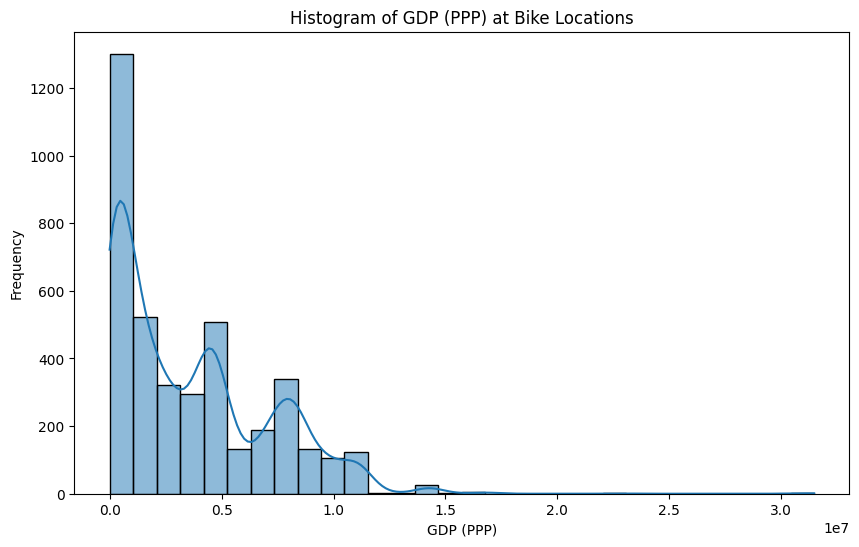

In [359]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate basic statistics for GDP_PPP
mean_gdp = df['GDP_PPP'].mean()
median_gdp = df['GDP_PPP'].median()
std_gdp = df['GDP_PPP'].std()

print(f"Mean GDP (PPP): {mean_gdp}")
print(f"Median GDP (PPP): {median_gdp}")
print(f"Standard Deviation of GDP (PPP): {std_gdp}")

# Plot a histogram of the GDP_PPP values
plt.figure(figsize=(10, 6))
sns.histplot(df['GDP_PPP'].dropna(), bins=30, kde=True)
plt.title('Histogram of GDP (PPP) at Bike Locations')
plt.xlabel('GDP (PPP)')
plt.ylabel('Frequency')
plt.show()


## Insights

1. Skewed distribution to the right. The majority of bike locations are concentrated in areas with lower GDP (PPP) values, as indicated by the high frequency in the lower bins 
2. Significant number of bikes in economically underdeveloped areas - huge potential for marketing!
3. Long tail towards the right - potential outliers with significant growth potential

In [361]:
import pandas as pd
import xarray as xr
import numpy as np
import folium
from folium.plugins import MarkerCluster
import branca.colormap as cm

# Load the bike data
df[['Latitude', 'Longitude']] = df['Coordinates'].str.split(',', expand=True)

# Convert Latitude and Longitude to strings to handle non-numeric values
df['Latitude'] = df['Latitude'].astype(str)
df['Longitude'] = df['Longitude'].astype(str)

# Remove non-numeric values from the Latitude and Longitude columns
df = df[df['Latitude'].apply(lambda x: x.replace('.', '', 1).isdigit()) & df['Longitude'].apply(lambda x: x.replace('.', '', 1).isdigit())]

# Convert Latitude and Longitude to float
df[['Latitude', 'Longitude']] = df[['Latitude', 'Longitude']].astype(float)

# Load the GDP NetCDF file
nc_file = 'doi_10_5061_dryad_dk1j0__v20200213/GDP_PPP_30arcsec_v3.nc'
ds = xr.open_dataset(nc_file)

# Function to sample GDP at given coordinates
def sample_gdp(lat, lon, ds):
    try:
        gdp_value = ds.sel(latitude=lat, longitude=lon, method='nearest')['GDP_PPP'].values
        return gdp_value[0] if gdp_value.size > 0 else np.nan
    except Exception as e:
        print(f"Error sampling GDP data: {e}")
        return np.nan

# Sample GDP data for each bike location
df['GDP_PPP'] = df.apply(
    lambda row: sample_gdp(row['Latitude'], row['Longitude'], ds),
    axis=1
)

# Initialize a map centered around the mean location
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=7)

# Create a colormap
min_gdp = df['GDP_PPP'].min()
max_gdp = df['GDP_PPP'].max()
colormap = cm.linear.YlOrRd_09.scale(min_gdp, max_gdp)
colormap.caption = 'GDP (PPP)'

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add markers to the map with colors based on GDP values
for idx, row in df.iterrows():
    if not np.isnan(row['GDP_PPP']):
        color = colormap(row['GDP_PPP'])
    else:
        color = 'gray'
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=5,
        popup=f"Vehicle Number: {row['Vehicle Number']}<br>GDP (PPP): {row['GDP_PPP']}",
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7
    ).add_to(marker_cluster)

# Add the colormap to the map
colormap.add_to(m)

# Save the map to an HTML file and display it
m.save('Bike_Locations_with_GDP_Map.html')
m


In [362]:
df

,Sl.no,Vehicle Number,Country,Latt/lang,Coordinates,Latitude,Longitude,Population_Density,GDP_PPP
0,1,DR4565,TOGO,"(6.150916,1.166555)","6.150916,1.166555",6.150916,1.166555,193,1.327984e+06
1,2,DR1718,TOGO,"(6.163551,1.156542)","6.163551,1.156542",6.163551,1.156542,193,5.128403e+05
2,3,DO7016,TOGO,"(6.163138,1.15666)","6.163138,1.15666",6.163138,1.156660,193,5.128403e+05
3,4,DR5419,TOGO,"(6.155077,1.159183)","6.155077,1.159183",6.155077,1.159183,193,1.327984e+06
4,5,DO6972,TOGO,"(6.154688,1.161805)","6.154688,1.161805",6.154688,1.161805,193,1.327984e+06
...,...,...,...,...,...,...,...,...,...
4258,4259,DO7443,TOGO,"(6.358809,1.668228)","6.358809,1.668228",6.358809,1.668228,157,1.542481e+04
4259,4260,DN3057,TOGO,"(6.192706,1.429098)","6.192706,1.429098",6.192706,1.429098,255,2.260664e+06
4260,4261,DM3272,TOGO,"(6.294932,1.131207)","6.294932,1.131207",6.294932,1.131207,223,4.316872e+03
4261,4262,DR0147,TOGO,"(6.946262,1.160155)","6.946262,1.160155",6.946262,1.160155,113,4.078876e+06


In [374]:
df.to_csv('Bike_Locations_with_GDP_and_PopDensity.csv', index=False)